In [33]:
import os
import cv2
import gdown
import shutil
import random
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import keras_tuner as kt
from keras.models import Model
from keras.models import Sequential, load_model
from keras.applications import VGG19
from keras.optimizers import Adam, RMSprop, SGD
from keras.utils import image_dataset_from_directory
from keras.layers import Input, Flatten, Dense, Dropout
from keras.callbacks import ModelCheckpoint, EarlyStopping
from sklearn.metrics import confusion_matrix, classification_report

## Downloading Datasets

### Folder Images

### List Attribute

In [3]:
list_attribute_url = 'https://drive.google.com/file/d/1Q0kgTKibawWFUX5zTLaVUP0NJs9dcVDt/view?usp=drive_link'
gdown.download(list_attribute_url, fuzzy=True)

Downloading...
From: https://drive.google.com/uc?id=1Q0kgTKibawWFUX5zTLaVUP0NJs9dcVDt
To: D:\nitip adit\Bootcamp\Project_1\gender-classification-based-on-face-recognition\list_attribute.txt
100%|█████████████████████████████████████████████████████████████████████████████| 26.7M/26.7M [00:12<00:00, 2.07MB/s]


'list_attribute.txt'

## Splitting Dataset

In [8]:
attribute_list_df = pd.read_csv('list_attribute.txt', sep='\s+', skiprows=1, usecols=['Male'])
attribute_list_df.index.name = 'filename'
attribute_list_df.replace(to_replace=-1, value=0, inplace=True)
attribute_list_df.rename(columns={"Male": "Gender"}, inplace=True)
attribute_list_df

,Gender
filename,
000001.jpg,0
000002.jpg,0
000003.jpg,1
000004.jpg,0
000005.jpg,0
...,...
202595.jpg,0
202596.jpg,1
202597.jpg,1


In [9]:
attribute_list_df.reset_index(drop=False, inplace=True)

In [10]:
attribute_list_df

,filename,Gender
0,000001.jpg,0
1,000002.jpg,0
2,000003.jpg,1
3,000004.jpg,0
4,000005.jpg,0
...,...,...
202594,202595.jpg,0
202595,202596.jpg,1
202596,202597.jpg,1
202597,202598.jpg,0


In [11]:
images_folder = os.listdir('Images')
attribute_list_df['isExist'] = attribute_list_df['filename'].isin(images_folder)
attribute_list_df

,filename,Gender,isExist
0,000001.jpg,0,False
1,000002.jpg,0,False
2,000003.jpg,1,False
3,000004.jpg,0,False
4,000005.jpg,0,False
...,...,...,...
202594,202595.jpg,0,False
202595,202596.jpg,1,False
202596,202597.jpg,1,False
202597,202598.jpg,0,False


In [12]:
attribute_list_df.drop(attribute_list_df[attribute_list_df['isExist'] == False].index, inplace=True)
attribute_list_df

,filename,Gender,isExist
50,000051.jpg,1,True
51,000052.jpg,1,True
64,000065.jpg,1,True
165,000166.jpg,1,True
197,000198.jpg,0,True
...,...,...,...
202319,202320.jpg,0,True
202339,202340.jpg,0,True
202346,202347.jpg,0,True
202356,202357.jpg,0,True


In [13]:
attribute_list_df.reset_index(drop=True, inplace=True)
attribute_list_df

,filename,Gender,isExist
0,000051.jpg,1,True
1,000052.jpg,1,True
2,000065.jpg,1,True
3,000166.jpg,1,True
4,000198.jpg,0,True
...,...,...,...
4995,202320.jpg,0,True
4996,202340.jpg,0,True
4997,202347.jpg,0,True
4998,202357.jpg,0,True


In [14]:
images_path = 'Images'
splitted_folder = 'Splitted'
train_folder = os.path.join(splitted_folder, 'Train')
validation_folder = os.path.join(splitted_folder, 'Validation')
test_folder = os.path.join(splitted_folder, 'Test')

In [15]:
os.makedirs(train_folder, exist_ok=True)
os.makedirs(validation_folder, exist_ok=True)
os.makedirs(test_folder, exist_ok=True)

In [16]:
for index, row in attribute_list_df.iterrows():
    filename = row['filename']
    gender_label = row['Gender']

    if index % 10 < 8:
        splitted_folder = train_folder
    elif index % 10 == 8:
        splitted_folder = validation_folder
    else:
        splitted_folder = test_folder

    if gender_label == 0:
        gender_folder = os.path.join(splitted_folder, 'Female')
    else:
        gender_folder = os.path.join(splitted_folder, 'Male')

    os.makedirs(gender_folder, exist_ok=True)

    source_path = os.path.join(images_path, filename)
    destination_path = os.path.join(gender_folder, filename)
    
    print(f'Copying file {source_path} to {gender_folder}')
    shutil.copy(source_path, destination_path)

print('Splitting Datasets completed')

Copying file Images\000051.jpg to Splitted\Train\Male
Copying file Images\000052.jpg to Splitted\Train\Male
Copying file Images\000065.jpg to Splitted\Train\Male
Copying file Images\000166.jpg to Splitted\Train\Male
Copying file Images\000198.jpg to Splitted\Train\Female
Copying file Images\000201.jpg to Splitted\Train\Female
Copying file Images\000240.jpg to Splitted\Train\Female
Copying file Images\000282.jpg to Splitted\Train\Male
Copying file Images\000352.jpg to Splitted\Validation\Male
Copying file Images\000409.jpg to Splitted\Test\Male
Copying file Images\000414.jpg to Splitted\Train\Male
Copying file Images\000439.jpg to Splitted\Train\Male
Copying file Images\000444.jpg to Splitted\Train\Male
Copying file Images\000474.jpg to Splitted\Train\Male
Copying file Images\000525.jpg to Splitted\Train\Female
Copying file Images\000545.jpg to Splitted\Train\Male
Copying file Images\000559.jpg to Splitted\Train\Male
Copying file Images\000572.jpg to Splitted\Train\Male
Copying file Ima

## Preprocessing

In [25]:
read_image = cv2.imread(source_path)
image_size = (read_image.shape[0], read_image.shape[1])
batch_size = 32

### Train Datasets

In [26]:
train_datasets = image_dataset_from_directory(
    directory=train_folder,
    seed=random.randint(1, 1000),
    class_names=os.listdir(train_folder),
    image_size=image_size,
    batch_size=batch_size
)

Found 4000 files belonging to 2 classes.


In [27]:
train_data_batches = [(data.numpy(), labels.numpy()) for data, labels in train_datasets]
train_data, train_labels = zip(*train_data_batches)
train_data = np.vstack(train_data)
train_labels = np.hstack(train_labels)

### Validation Datasets

In [28]:
validation_datasets = image_dataset_from_directory(
    directory=validation_folder,
    seed=random.randint(1, 1000),
    class_names=os.listdir(validation_folder),
    image_size=image_size,
    batch_size=batch_size
)

Found 500 files belonging to 2 classes.


In [29]:
validation_data_batches = [(data.numpy(), labels.numpy()) for data, labels in validation_datasets]
validation_data, validation_labels = zip(*validation_data_batches)
validation_data = np.vstack(validation_data)
validation_labels = np.hstack(validation_labels)

### Test Datasets

In [30]:
test_datasets = image_dataset_from_directory(
    directory=test_folder,
    seed=random.randint(1, 1000),
    class_names=os.listdir(test_folder),
    image_size=image_size,
    batch_size=batch_size
)

Found 500 files belonging to 2 classes.


In [31]:
test_data_batches = [(data.numpy(), labels.numpy()) for data, labels in test_datasets]
test_data, test_labels = zip(*test_data_batches)
test_data = np.vstack(test_data)
test_labels = np.hstack(test_labels)

## Build Model

In [32]:
epochs = 100
hp_opz = ['hyperband', 'RandomSearch', 'BayesianOptimization']

In [34]:
def build_vgg(hp):
    vgg = VGG19(weights='imagenet', include_top=False, input_tensor=Input(shape=read_image.shape))
    vgg.trainable = False

    model = Sequential()

    for vgg_layer in vgg.layers:
        model.add(vgg_layer)

    model.add(Flatten())
    
    num_hidden_layers = hp.Int('num_hidden_layers', min_value=1, max_value=5, step=1)
    for i in range(num_hidden_layers):
        num_units = hp.Choice(f'num_units_{i}', values=[8, 16, 32, 64])
        dropout_rate = hp.Float(f'dropout_rate_{i}', min_value=0.1, max_value=0.9, step=0.1)

        if i == 0:
            model.add(Dense(num_units, activation='relu'))
        else:
            model.add(Dense(num_units, activation='relu'))
            model.add(Dropout(dropout_rate))
            
    model.add(Dense(1, activation='sigmoid'))

    optimizer = hp.Choice('optimizer', values=['Adam', 'RMSprop', 'SGD'])
    loss_function = hp.Choice('loss_function', values=['binary_crossentropy', 'hinge', 'squared_hinge'])
    learning_rate = hp.Choice('learning_rate', values=[1e-5, 1e-4, 1e-3, 3e-3, 1e-2, 3e-2, 0.1, 0.3])
    if optimizer == 'Adam':
        opt = Adam(learning_rate=learning_rate)
        model.compile(loss=loss_function, optimizer=opt, metrics=['accuracy'])
        
    if optimizer == 'RMSprop':
        opt = RMSprop(learning_rate=learning_rate)
        model.compile(loss=loss_function, optimizer=opt, metrics=['accuracy'])

    if optimizer == 'SGD': 
        opt = SGD(learning_rate=learning_rate)
        model.compile(loss=loss_function, optimizer=opt, metrics=['accuracy'])

    return model

## Hyperparameter Tuning

### Hyperband Tuning

In [35]:
hyperband_tuner = kt.Hyperband(
    build_vgg,
    objective='val_accuracy',
    max_epochs=epochs,
    factor=3,
    seed=42,
    directory='tuner',
    project_name=str(hp_opz[0] + 'vgg19')
)

80134624/80134624 [==============================] - 44s 1us/step


In [36]:
best_hyperband_param = {}
hyperband_tuner.search(train_datasets, validation_data=(validation_datasets), epochs=epochs, batch_size=batch_size, shuffle=True)

hyperband_results = hyperband_tuner.results_summary()

Trial 254 Complete [00h 16m 21s]
val_accuracy: 0.871999979019165

Best val_accuracy So Far: 0.949999988079071
Total elapsed time: 07h 27m 22s
Results summary
Results in tuner\hyperbandvgg19
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 0245 summary
Hyperparameters:
num_hidden_layers: 3
num_units_0: 64
dropout_rate_0: 0.8
optimizer: Adam
loss_function: hinge
learning_rate: 0.0001
num_units_1: 16
dropout_rate_1: 0.30000000000000004
num_units_2: 64
dropout_rate_2: 0.7000000000000001
num_units_3: 16
dropout_rate_3: 0.2
num_units_4: 32
dropout_rate_4: 0.8
tuner/epochs: 100
tuner/initial_epoch: 34
tuner/bracket: 1
tuner/round: 1
tuner/trial_id: 0243
Score: 0.949999988079071

Trial 0251 summary
Hyperparameters:
num_hidden_layers: 2
num_units_0: 64
dropout_rate_0: 0.5
optimizer: RMSprop
loss_function: hinge
learning_rate: 0.001
num_units_1: 64
dropout_rate_1: 0.5
num_units_2: 64
dropout_rate_2: 0.2
num_units_3: 16
dropout_rate_3: 0.2
num_units_4: 16
dropout_rate

In [37]:
best_hyperband_param = hyperband_tuner.get_best_hyperparameters(num_trials=1)[0]

cp = ModelCheckpoint('VGG19-with-{}-Optimization.h5'.format(hp_opz[0]), monitor='val_loss', save_best_only=True,
                     save_weights_only=False, mode='auto', save_freq='epoch', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=25)

best_hyperband_model = hyperband_tuner.hypermodel.build(best_hyperband_param)
best_hyperband_model = best_hyperband_model.fit(train_datasets, validation_data=(test_datasets), epochs=epochs,
                                                batch_size=batch_size, callbacks=[cp, early_stopping], shuffle=True)

Epoch 1/100
125/125 [==============================] - ETA: 0s - loss: 0.9959 - accuracy: 0.5918
Epoch 1: val_loss improved from inf to 0.75193, saving model to VGG19-with-hyperband-Optimization.h5
125/125 [==============================] - 12s 84ms/step - loss: 0.9959 - accuracy: 0.5918 - val_loss: 0.7519 - val_accuracy: 0.8620
Epoch 2/100
125/125 [==============================] - ETA: 0s - loss: 0.8862 - accuracy: 0.7030
Epoch 2: val_loss improved from 0.75193 to 0.70914, saving model to VGG19-with-hyperband-Optimization.h5
125/125 [==============================] - 10s 82ms/step - loss: 0.8862 - accuracy: 0.7030 - val_loss: 0.7091 - val_accuracy: 0.8820
Epoch 3/100
125/125 [==============================] - ETA: 0s - loss: 0.7995 - accuracy: 0.7870
Epoch 3: val_loss improved from 0.70914 to 0.69891, saving model to VGG19-with-hyperband-Optimization.h5
125/125 [==============================] - 10s 82ms/step - loss: 0.7995 - accuracy: 0.7870 - val_loss: 0.6989 - val_accuracy: 0.8960

### RandomSearch Tuning

In [38]:
randomsearch_tuner = kt.RandomSearch(
    build_vgg,
    objective='val_accuracy',
    max_trials=10,
    seed=42,
    executions_per_trial=1,
    directory='tuner',
    project_name=str(hp_opz[1] + 'vgg19')
)

In [39]:
best_randomsearch_param = {}
randomsearch_tuner.search(train_datasets, validation_data=(validation_datasets), epochs=epochs, batch_size=batch_size, shuffle=True)

randomsearch_results = randomsearch_tuner.results_summary()

Trial 10 Complete [00h 17m 12s]
val_accuracy: 0.9179999828338623

Best val_accuracy So Far: 0.9399999976158142
Total elapsed time: 02h 50m 29s
Results summary
Results in tuner\RandomSearchvgg19
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 02 summary
Hyperparameters:
num_hidden_layers: 2
num_units_0: 16
dropout_rate_0: 0.9
optimizer: RMSprop
loss_function: hinge
learning_rate: 0.003
num_units_1: 8
dropout_rate_1: 0.1
num_units_2: 32
dropout_rate_2: 0.7000000000000001
num_units_3: 64
dropout_rate_3: 0.30000000000000004
Score: 0.9399999976158142

Trial 00 summary
Hyperparameters:
num_hidden_layers: 4
num_units_0: 8
dropout_rate_0: 0.4
optimizer: Adam
loss_function: squared_hinge
learning_rate: 0.001
num_units_1: 8
dropout_rate_1: 0.1
num_units_2: 8
dropout_rate_2: 0.1
num_units_3: 8
dropout_rate_3: 0.1
Score: 0.9380000233650208

Trial 09 summary
Hyperparameters:
num_hidden_layers: 3
num_units_0: 64
dropout_rate_0: 0.2
optimizer: RMSprop
loss_function: hing

In [40]:
best_randomsearch_param = randomsearch_tuner.get_best_hyperparameters(num_trials=1)[0]

cp = ModelCheckpoint('VGG19-with-{}-Optimization.h5'.format(hp_opz[1]), monitor='val_loss', save_best_only=True,
                     save_weights_only=False, mode='auto', save_freq='epoch', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=25)

best_randomsearch_model = randomsearch_tuner.hypermodel.build(best_randomsearch_param)
best_randomsearch_model = best_randomsearch_model.fit(train_datasets, validation_data=(test_datasets), epochs=100,
                                                batch_size=16, callbacks=[cp, early_stopping], shuffle=True)

Epoch 1/100
125/125 [==============================] - ETA: 0s - loss: 0.8818 - accuracy: 0.7042
Epoch 1: val_loss improved from inf to 0.77135, saving model to VGG19-with-RandomSearch-Optimization.h5
125/125 [==============================] - 11s 82ms/step - loss: 0.8818 - accuracy: 0.7042 - val_loss: 0.7713 - val_accuracy: 0.8220
Epoch 2/100
125/125 [==============================] - ETA: 0s - loss: 0.7580 - accuracy: 0.8290
Epoch 2: val_loss improved from 0.77135 to 0.70058, saving model to VGG19-with-RandomSearch-Optimization.h5
125/125 [==============================] - 10s 80ms/step - loss: 0.7580 - accuracy: 0.8290 - val_loss: 0.7006 - val_accuracy: 0.8920
Epoch 3/100
125/125 [==============================] - ETA: 0s - loss: 0.7171 - accuracy: 0.8692
Epoch 3: val_loss did not improve from 0.70058
125/125 [==============================] - 10s 79ms/step - loss: 0.7171 - accuracy: 0.8692 - val_loss: 0.7049 - val_accuracy: 0.8880
Epoch 4/100
125/125 [==============================

### Bayesian Optimization Tuning

In [41]:
bayesian_tuner = kt.BayesianOptimization(
    build_vgg,
    objective='val_accuracy',
    max_trials=10,
    seed=42,
    directory='tuner',
    project_name=str(hp_opz[2] + 'vgg19')
)

In [42]:
best_bayesian_param = {}
bayesian_tuner.search(train_datasets, validation_data=(validation_datasets), epochs=epochs, batch_size=batch_size, shuffle=True)

bayesian_results = bayesian_tuner.results_summary()

Trial 10 Complete [00h 16m 32s]
val_accuracy: 0.9020000100135803

Best val_accuracy So Far: 0.9480000138282776
Total elapsed time: 02h 45m 49s
Results summary
Results in tuner\BayesianOptimizationvgg19
Showing 10 best trials
Objective(name="val_accuracy", direction="max")

Trial 02 summary
Hyperparameters:
num_hidden_layers: 2
num_units_0: 16
dropout_rate_0: 0.9
optimizer: RMSprop
loss_function: hinge
learning_rate: 0.003
num_units_1: 8
dropout_rate_1: 0.1
num_units_2: 32
dropout_rate_2: 0.7000000000000001
num_units_3: 64
dropout_rate_3: 0.30000000000000004
Score: 0.9480000138282776

Trial 00 summary
Hyperparameters:
num_hidden_layers: 4
num_units_0: 8
dropout_rate_0: 0.4
optimizer: Adam
loss_function: squared_hinge
learning_rate: 0.001
num_units_1: 8
dropout_rate_1: 0.1
num_units_2: 8
dropout_rate_2: 0.1
num_units_3: 8
dropout_rate_3: 0.1
Score: 0.9419999718666077

Trial 09 summary
Hyperparameters:
num_hidden_layers: 3
num_units_0: 64
dropout_rate_0: 0.2
optimizer: RMSprop
loss_functi

In [43]:
best_bayesian_param = bayesian_tuner.get_best_hyperparameters(num_trials=1)[0]

cp = ModelCheckpoint('VGG19-with-{}-Optimization.h5'.format(hp_opz[2]), monitor='val_loss', save_best_only=True,
                     save_weights_only=False, mode='auto', save_freq='epoch', verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=25)

best_bayesian_model = bayesian_tuner.hypermodel.build(best_bayesian_param)
best_bayesian_model = best_bayesian_model.fit(train_datasets, validation_data=(test_datasets), epochs=100,
                                                batch_size=16, callbacks=[cp, early_stopping], shuffle=True)

Epoch 1/100
125/125 [==============================] - ETA: 0s - loss: 1.1729 - accuracy: 0.4137
Epoch 1: val_loss improved from inf to 1.18400, saving model to VGG19-with-BayesianOptimization-Optimization.h5
125/125 [==============================] - 12s 83ms/step - loss: 1.1729 - accuracy: 0.4137 - val_loss: 1.1840 - val_accuracy: 0.4080
Epoch 2/100
125/125 [==============================] - ETA: 0s - loss: 1.1731 - accuracy: 0.4135
Epoch 2: val_loss did not improve from 1.18400
125/125 [==============================] - 10s 79ms/step - loss: 1.1731 - accuracy: 0.4135 - val_loss: 1.1840 - val_accuracy: 0.4080
Epoch 3/100
125/125 [==============================] - ETA: 0s - loss: 1.1730 - accuracy: 0.4135
Epoch 3: val_loss did not improve from 1.18400
125/125 [==============================] - 10s 79ms/step - loss: 1.1730 - accuracy: 0.4135 - val_loss: 1.1840 - val_accuracy: 0.4080
Epoch 4/100
125/125 [==============================] - ETA: 0s - loss: 1.1730 - accuracy: 0.4135
Epoch 4

## Evaluation

### Hyperband

In [47]:
vgg19_hyperband = load_model('VGG19-with-hyperband-Optimization.h5')

loss, accuracy = vgg16_hyperband.evaluate(test_datasets)
print(f'VGG16 with Hyperband Tuning model loss: {loss}, accuracy: {accuracy}')

16/16 [==============================] - 1s 68ms/step - loss: 0.6733 - accuracy: 0.9180
VGG16 with Hyperband Tuning model loss: 0.6732985377311707, accuracy: 0.9179999828338623


### RandomSearch

In [48]:
vgg19_randomsearch = load_model('VGG19-with-RandomSearch-Optimization.h5')

loss, accuracy = vgg16_randomsearch.evaluate(test_datasets)
print(f'VGG16 with RandomSearch Tuning model loss: {loss}, accuracy: {accuracy}')

16/16 [==============================] - 1s 69ms/step - loss: 0.6683 - accuracy: 0.9240
VGG16 with RandomSearch Tuning model loss: 0.6683416962623596, accuracy: 0.9240000247955322


### Bayesian

In [49]:
vgg19_bayesian = load_model('VGG19-with-BayesianOptimization-Optimization.h5')

loss, accuracy = vgg16_bayesian.evaluate(test_datasets)
print(f'VGG16 with Bayesian Tuning model loss: {loss}, accuracy: {accuracy}')

16/16 [==============================] - 1s 69ms/step - loss: 0.6765 - accuracy: 0.9160
VGG16 with Bayesian Tuning model loss: 0.6764726638793945, accuracy: 0.9160000085830688


## Confusion Matrix

### Hyperband

16/16 [==============================] - 1s 76ms/step
              precision    recall  f1-score   support

           0       0.96      0.90      0.93       296
           1       0.87      0.94      0.90       204

    accuracy                           0.92       500
   macro avg       0.91      0.92      0.92       500
weighted avg       0.92      0.92      0.92       500



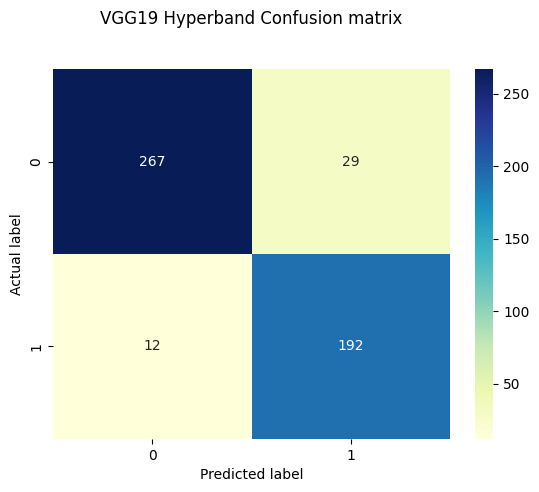

In [50]:
vgg19_hyperband_prediction = vgg19_hyperband.predict(test_data)
cnf_matrix = confusion_matrix(test_labels, np.round(vgg19_hyperband_prediction))

p = sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
plt.title('VGG19 Hyperband Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

print(classification_report(test_labels, np.round(vgg19_hyperband_prediction)))

### RandomSearch

16/16 [==============================] - 1s 83ms/step
              precision    recall  f1-score   support

           0       0.95      0.92      0.93       296
           1       0.89      0.93      0.91       204

    accuracy                           0.92       500
   macro avg       0.92      0.93      0.92       500
weighted avg       0.93      0.92      0.92       500



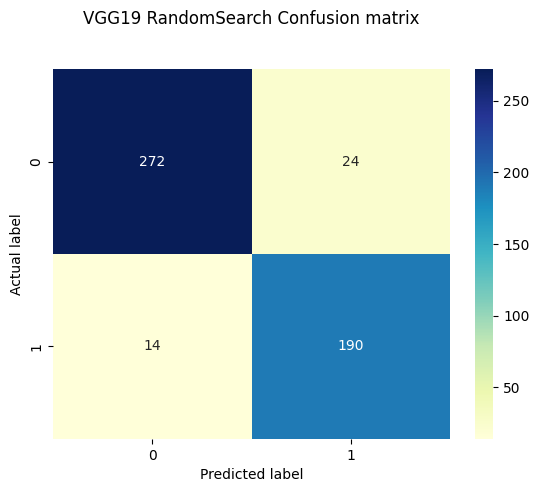

In [51]:
vgg19_randomsearch_prediction = vgg19_randomsearch.predict(test_data)
cnf_matrix = confusion_matrix(test_labels, np.round(vgg19_randomsearch_prediction))

p = sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
plt.title('VGG19 RandomSearch Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

print(classification_report(test_labels, np.round(vgg19_randomsearch_prediction)))

### Bayesian

16/16 [==============================] - 1s 75ms/step
              precision    recall  f1-score   support

           0       0.95      0.91      0.93       296
           1       0.87      0.93      0.90       204

    accuracy                           0.92       500
   macro avg       0.91      0.92      0.91       500
weighted avg       0.92      0.92      0.92       500



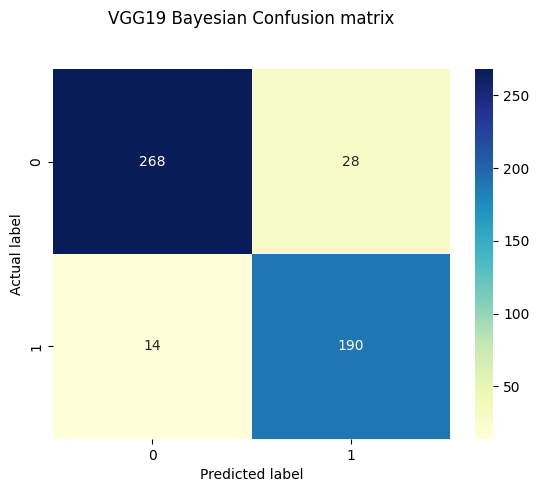

In [52]:
vgg19_bayesian_prediction = vgg19_bayesian.predict(test_data)
cnf_matrix = confusion_matrix(test_labels, np.round(vgg19_bayesian_prediction))

p = sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
plt.title('VGG19 Bayesian Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

print(classification_report(test_labels, np.round(vgg19_bayesian_prediction)))

## Test Prediction

### Hyperband

1/1 [==============================] - 0s 29ms/step


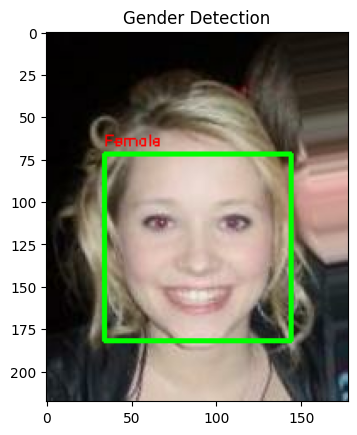

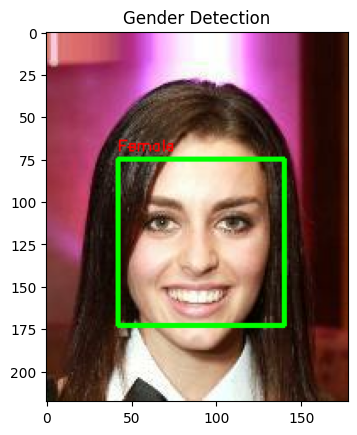

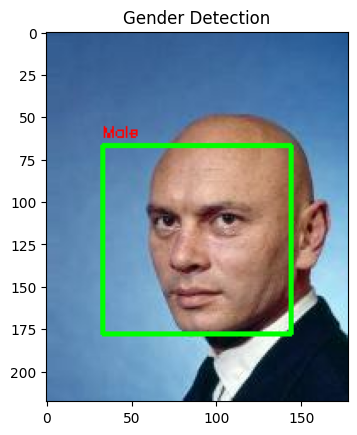

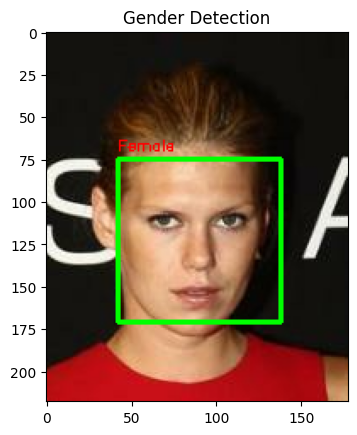

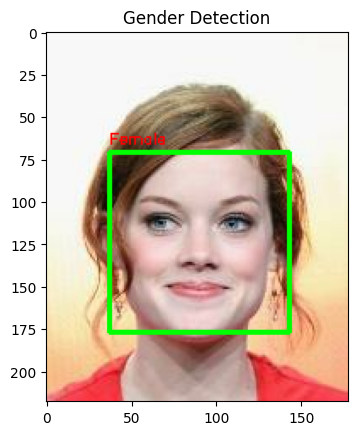

...

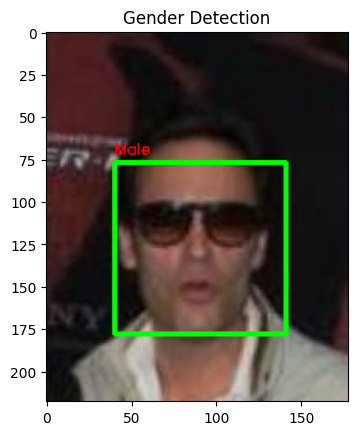

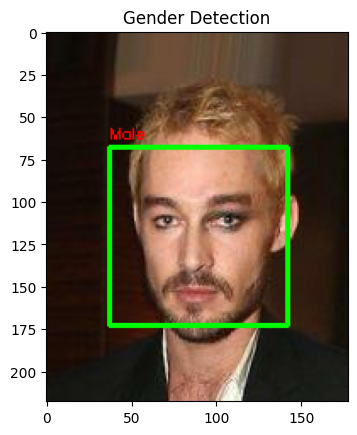

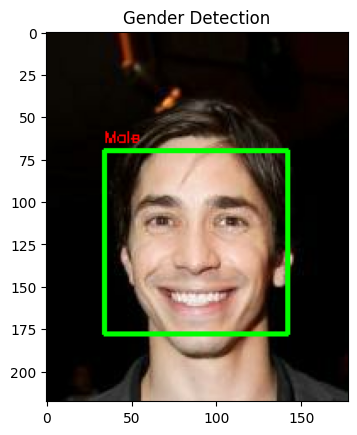

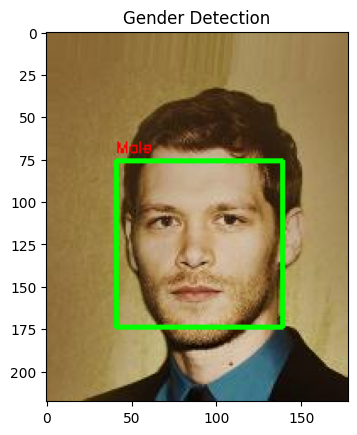

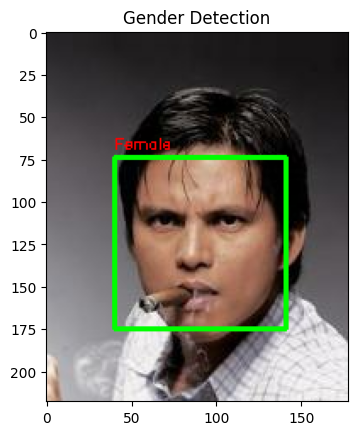

In [74]:
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
for images, labels in test_datasets.take(1):
    predicts = vgg19_hyperband.predict(images)
    for image, predict in zip(images, predicts):
        image = np.array(image, dtype='uint8')
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        faces = face_cascade.detectMultiScale(gray, 1.3, 5)

        for (x, y, w, h) in faces:
            if np.round(predict) == 0:
                cv2.rectangle(image, (x, y),((x + w), (y + h)), (0, 255, 0), 2)
                cv2.putText(image, 'Female', (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (255, 0, 0), 1)
                plt.imshow(image)
                plt.title('Gender Detection')
                plt.show()
            else:
                cv2.rectangle(image, (x, y),((x + w), (y + h)), (0, 255, 0), 2)
                cv2.putText(image, 'Male', (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (255, 0, 0), 1)
                plt.imshow(image)
                plt.title('Gender Detection')
                plt.show()         
    break

### RandomSearch

1/1 [==============================] - 0s 32ms/step


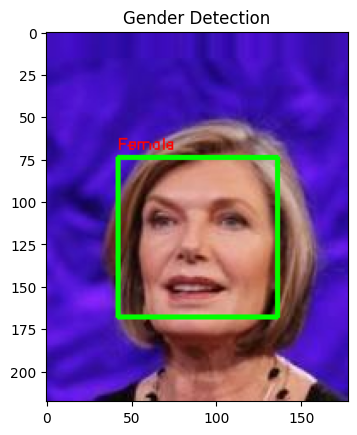

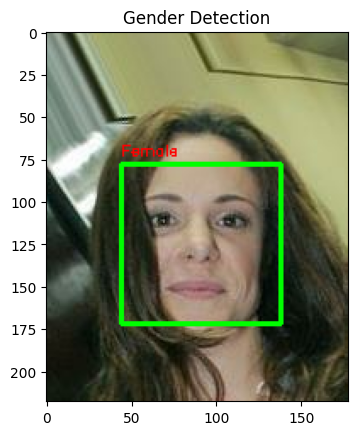

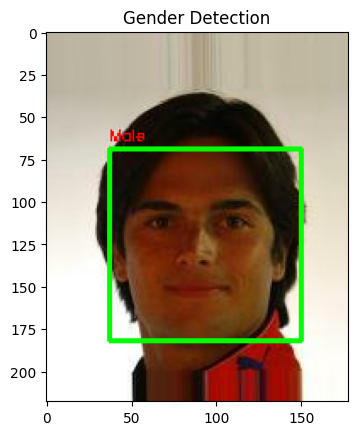

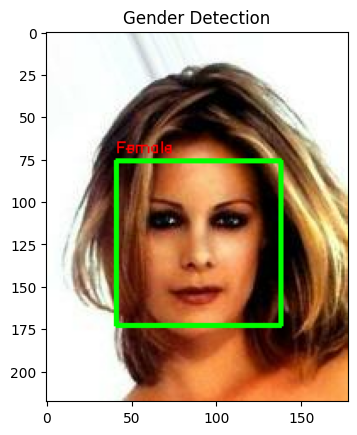

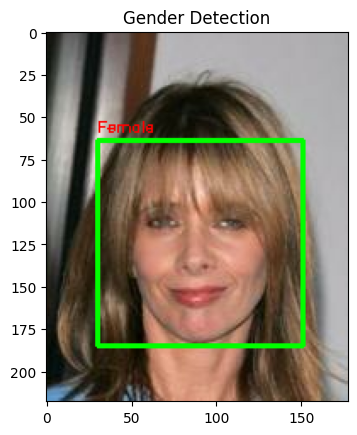

...

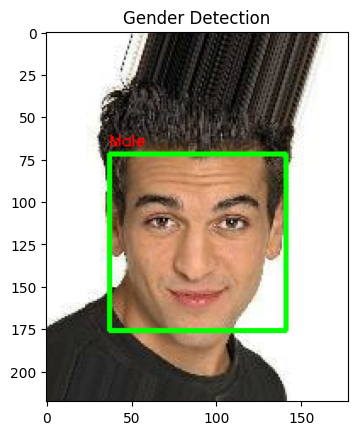

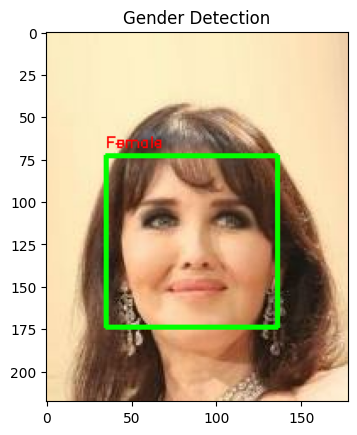

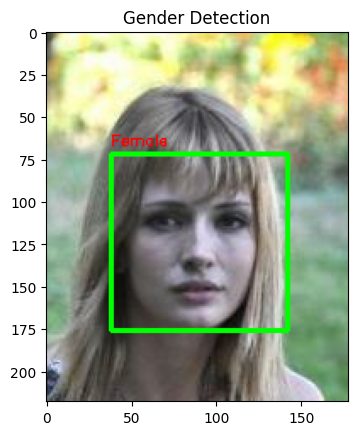

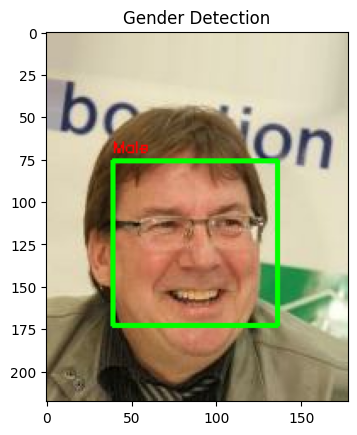

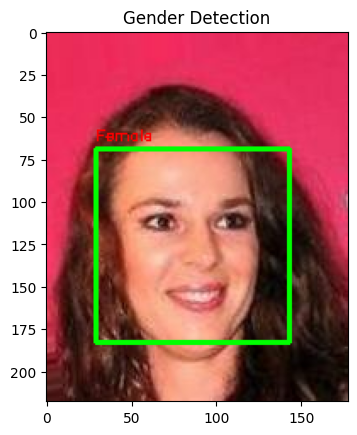

In [76]:
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
for images, labels in test_datasets.take(1):
    predicts = vgg19_randomsearch.predict(images)
    for image, predict in zip(images, predicts):
        image = np.array(image, dtype='uint8')
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        faces = face_cascade.detectMultiScale(gray, 1.3, 5)

        for (x, y, w, h) in faces:
            if np.round(predict) == 0:
                cv2.rectangle(image, (x, y),((x + w), (y + h)), (0, 255, 0), 2)
                cv2.putText(image, 'Female', (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (255, 0, 0), 1)
                plt.imshow(image)
                plt.title('Gender Detection')
                plt.show()
            else:
                cv2.rectangle(image, (x, y),((x + w), (y + h)), (0, 255, 0), 2)
                cv2.putText(image, 'Male', (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (255, 0, 0), 1)
                plt.imshow(image)
                plt.title('Gender Detection')
                plt.show()         
    break

### Bayesian

1/1 [==============================] - 0s 32ms/step


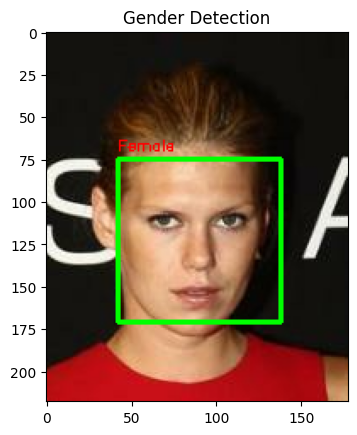

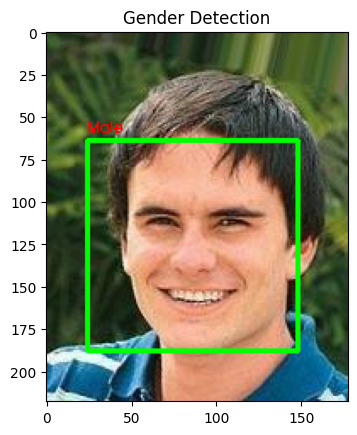

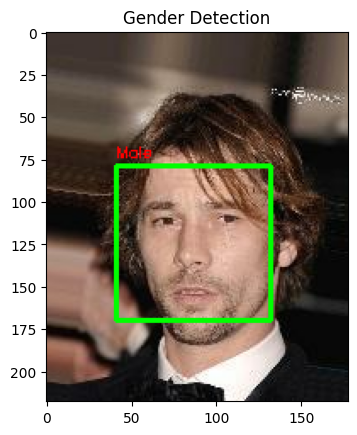

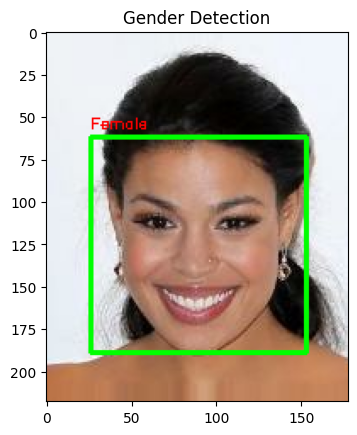

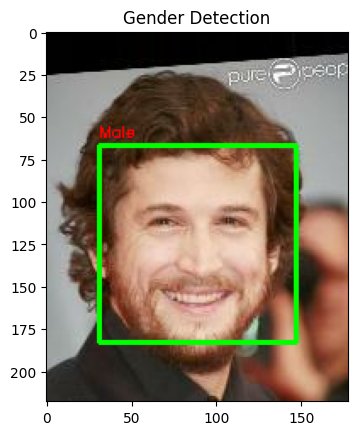

...

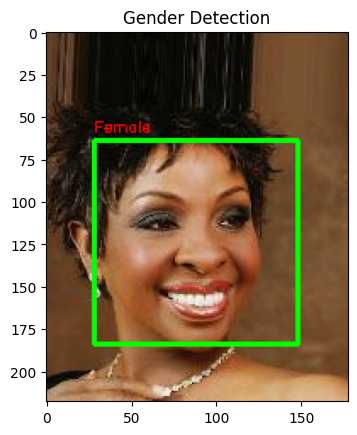

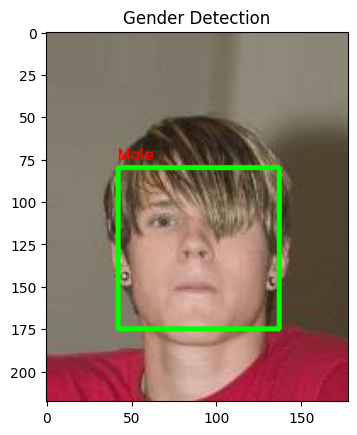

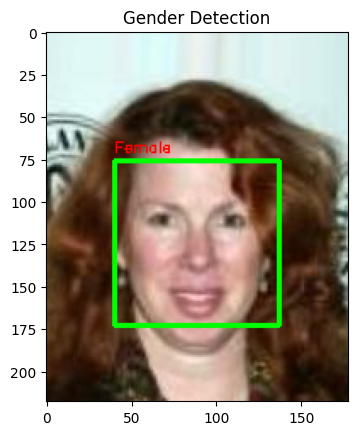

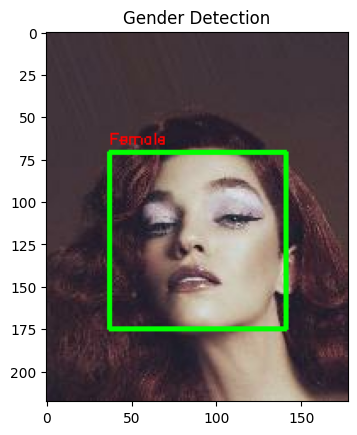

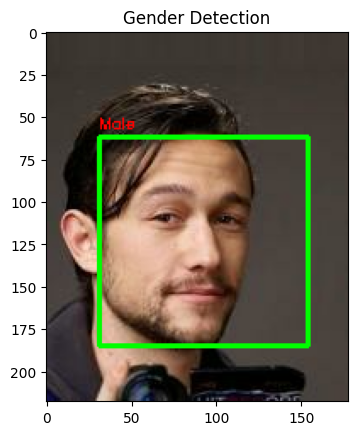

In [77]:
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
for images, labels in test_datasets.take(1):
    predicts = vgg19_bayesian.predict(images)
    for image, predict in zip(images, predicts):
        image = np.array(image, dtype='uint8')
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        faces = face_cascade.detectMultiScale(gray, 1.3, 5)

        for (x, y, w, h) in faces:
            if np.round(predict) == 0:
                cv2.rectangle(image, (x, y),((x + w), (y + h)), (0, 255, 0), 2)
                cv2.putText(image, 'Female', (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (255, 0, 0), 1)
                plt.imshow(image)
                plt.title('Gender Detection')
                plt.show()
            else:
                cv2.rectangle(image, (x, y),((x + w), (y + h)), (0, 255, 0), 2)
                cv2.putText(image, 'Male', (x, y-5), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (255, 0, 0), 1)
                plt.imshow(image)
                plt.title('Gender Detection')
                plt.show()         
    break